In [1]:
# File to use to test the main function, utility functions, and structure. Later will move changes to functions to separate files in utils folder.

In [1]:
#imports
import pandas as pd
import numpy as np
import hvplot.pandas

import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [2]:
# import functions
from utils.AlpacaFunctions import get_historical_dataframe
from utils.data_process import return_rolling_averages
from utils.data_process import return_crossovers
from alpaca_trade_api.rest import TimeFrame

In [377]:
# set ticker, start date, end date, timeframe
ticker = "ARKK"

today = '2022-01-13'

start_date = '2021-10-13'

end_date = today

timeframe = '1Min'



In [378]:
df = get_historical_dataframe(ticker, timeframe, start_date, end_date)

In [379]:
df_finta = df[['open', 'high', 'low', 'close', 'volume']]
from finta import TA
volume_df = pd.DataFrame(df["volume"])
df['vama'] = TA.VAMA(df_finta)
df['rsi'] = TA.RSI(df_finta)
df['ao'] = TA.AO(df_finta)
df

,open,high,low,close,volume,trade_count,vwap,vama,rsi,ao
timestamp,,,,,,,,,,
2021-10-13 08:43:00+00:00,111.96,111.9900,111.96,111.99,519,10,111.929210,NaN,NaN,NaN
2021-10-13 08:49:00+00:00,112.00,112.0000,112.00,112.00,201,2,111.997512,NaN,100.000000,NaN
2021-10-13 11:01:00+00:00,112.70,112.7000,112.70,112.70,425,4,112.684918,NaN,100.000000,NaN
2021-10-13 11:03:00+00:00,112.57,112.5700,112.57,112.57,200,4,112.558450,NaN,83.515559,NaN
2021-10-13 11:49:00+00:00,112.29,112.2900,112.29,112.29,173,4,112.284682,NaN,60.415159,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,79.84,79.8401,79.83,79.83,640,19,79.843610,79.892340,44.170850,-0.031758
2022-01-14 00:55:00+00:00,79.86,79.8600,79.85,79.85,376,11,79.858298,79.899561,46.054866,-0.015022
2022-01-14 00:56:00+00:00,79.80,79.8200,79.80,79.82,613,12,79.822284,79.891870,43.674065,-0.022434


In [380]:
volume_df

,volume
timestamp,
2021-10-13 08:43:00+00:00,519
2021-10-13 08:49:00+00:00,201
2021-10-13 11:01:00+00:00,425
2021-10-13 11:03:00+00:00,200
2021-10-13 11:49:00+00:00,173
...,...
2022-01-14 00:53:00+00:00,640
2022-01-14 00:55:00+00:00,376
2022-01-14 00:56:00+00:00,613


In [381]:
close_df = pd.DataFrame(df["close"])

In [382]:
df.drop(columns = ['volume', 'close'], inplace=True)
close_df.head(20)

,close
timestamp,
2021-10-13 08:43:00+00:00,111.99
2021-10-13 08:49:00+00:00,112.00
2021-10-13 11:01:00+00:00,112.70
2021-10-13 11:03:00+00:00,112.57
2021-10-13 11:49:00+00:00,112.29
2021-10-13 11:52:00+00:00,112.29
2021-10-13 11:53:00+00:00,112.29
2021-10-13 12:03:00+00:00,112.29
2021-10-13 12:06:00+00:00,112.40


In [383]:
return_rolling_averages(close_df)

In [384]:
close_df.head(20)

,close,2,3,5,8,10,13,20,21,34,50,55,89,100,144,200
timestamp,,,,,,,,,,,,,,,,
2021-10-13 08:43:00+00:00,111.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 08:49:00+00:00,112.00,111.995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:01:00+00:00,112.70,112.350,112.230000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:03:00+00:00,112.57,112.635,112.423333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:49:00+00:00,112.29,112.430,112.520000,112.310,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:52:00+00:00,112.29,112.290,112.383333,112.370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:53:00+00:00,112.29,112.290,112.290000,112.428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 12:03:00+00:00,112.29,112.290,112.290000,112.346,112.30250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 12:06:00+00:00,112.40,112.345,112.326667,112.312,112.35375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [385]:
cross_df = return_crossovers(close_df)

C:\Users\sjufa\Desktop\Bootcamp Files\team_2\sentiment_stocks_trading\utils\data_process.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  cross_df[str(columns[col]) + " to " + str(columns[col2])] = ((dataframe[columns[col2]] < dataframe[columns[col]]) & ((dataframe.shift()[columns[col2]] > dataframe.shift()[columns[col]]))) * 1 - ((dataframe[columns[col2]] > dataframe[columns[col]]) & ((dataframe.shift()[columns[col2]] < dataframe.shift()[columns[col]]))) * 1


In [386]:
cross_df.head(20)
close_df.head()

,close,2,3,5,8,10,13,20,21,34,50,55,89,100,144,200
timestamp,,,,,,,,,,,,,,,,
2021-10-13 08:43:00+00:00,111.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 08:49:00+00:00,112.00,111.995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:01:00+00:00,112.70,112.350,112.230000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:03:00+00:00,112.57,112.635,112.423333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:49:00+00:00,112.29,112.430,112.520000,112.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [387]:
pct_change_df = close_df.pct_change()

In [388]:
pct_change_df.rename(columns = {'close' : 'pct_change'}, inplace=True)
pct_change_df

,pct_change,2,3,5,8,10,13,20,21,34,50,55,89,100,144,200
timestamp,,,,,,,,,,,,,,,,
2021-10-13 08:43:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 08:49:00+00:00,0.000089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:01:00+00:00,0.006250,0.003170,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:03:00+00:00,-0.001154,0.002537,0.001723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-13 11:49:00+00:00,-0.002487,-0.001820,0.000860,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,-0.001126,-0.000563,-0.000292,-0.000300,0.000016,-0.000088,2.220446e-16,-0.000069,-0.000066,-0.000103,-0.000048,-0.000059,-0.000017,-0.000036,-0.000059,-0.000105
2022-01-14 00:55:00+00:00,0.000251,-0.000438,-0.000292,0.000125,0.000063,0.000050,1.926151e-05,-0.000056,-0.000054,-0.000074,-0.000043,-0.000055,-0.000020,-0.000026,-0.000049,-0.000098
2022-01-14 00:56:00+00:00,-0.000376,-0.000063,-0.000417,-0.000200,-0.000203,0.000000,-7.704457e-05,-0.000050,-0.000072,-0.000066,-0.000045,-0.000055,-0.000025,-0.000035,-0.000051,-0.000100


In [389]:
signals_input_df = pd.concat([pct_change_df, cross_df, volume_df, close_df['close'], df], axis=1)
signals_input_df['close']

timestamp
2021-10-13 08:43:00+00:00    111.99
2021-10-13 08:49:00+00:00    112.00
2021-10-13 11:01:00+00:00    112.70
2021-10-13 11:03:00+00:00    112.57
2021-10-13 11:49:00+00:00    112.29
                              ...  
2022-01-14 00:53:00+00:00     79.83
2022-01-14 00:55:00+00:00     79.85
2022-01-14 00:56:00+00:00     79.82
2022-01-14 00:57:00+00:00     79.84
2022-01-14 00:58:00+00:00     79.84
Name: close, Length: 31513, dtype: float64

In [390]:
cross_df

,close to 2,close to 3,close to 5,close to 8,close to 10,close to 13,close to 20,close to 21,close to 34,close to 50,...,55 to 89,55 to 100,55 to 144,55 to 200,89 to 100,89 to 144,89 to 200,100 to 144,100 to 200,144 to 200
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-10-13 08:43:00+00:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-10-13 08:49:00+00:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-10-13 11:01:00+00:00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-10-13 11:03:00+00:00,-1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2021-10-13 11:49:00+00:00,0,-1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,0,-1,-1,-1,-1,-1,-1,-1,-1,0,...,0,0,0,0,1,0,0,0,0,0
2022-01-14 00:55:00+00:00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-01-14 00:56:00+00:00,-1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [391]:
# Create new close column shifted one from original close column for comparison to generate signal
close_shift_df = pd.DataFrame(signals_input_df['close'])
close_shift_df['close'].iloc[0] = 0
close_shift_df = close_shift_df.shift(-1)
close_shift_df


,close
timestamp,
2021-10-13 08:43:00+00:00,112.00
2021-10-13 08:49:00+00:00,112.70
2021-10-13 11:01:00+00:00,112.57
2021-10-13 11:03:00+00:00,112.29
2021-10-13 11:49:00+00:00,112.29
...,...
2022-01-14 00:53:00+00:00,79.85
2022-01-14 00:55:00+00:00,79.82
2022-01-14 00:56:00+00:00,79.84


In [470]:
# Create signal 0 if the following day's close will be lower than the current day's, 1 if it will be higher
signals_input_df['signal'] = np.where(close_shift_df['close'] < close_df['close'],0.0,1.0)
signals_input_df['entry/exit'] = signals_input_df['signal'].diff().fillna(0)
display(signals_input_df[['entry/exit', 'signal', 'close']])
signals_input_df.corr()

,entry/exit,signal,close
timestamp,,,
2021-10-13 08:43:00+00:00,0.0,1.0,111.99
2021-10-13 08:49:00+00:00,0.0,1.0,112.00
2021-10-13 11:01:00+00:00,-1.0,0.0,112.70
2021-10-13 11:03:00+00:00,0.0,0.0,112.57
2021-10-13 11:49:00+00:00,1.0,1.0,112.29
...,...,...,...
2022-01-14 00:53:00+00:00,1.0,1.0,79.83
2022-01-14 00:55:00+00:00,-1.0,0.0,79.85
2022-01-14 00:56:00+00:00,1.0,1.0,79.82


,pct_change,2,3,5,8,10,13,20,21,34,...,open,high,low,trade_count,vwap,vama,rsi,ao,signal,entry/exit
pct_change,1.000000,0.684222,0.564540,0.442149,0.349976,0.316572,0.274584,0.214558,0.213391,0.176156,...,0.004410,0.008104,0.007801,-0.003334,0.008316,0.003180,0.310426,0.030351,-0.025516,-0.447437
2,0.684222,1.000000,0.797198,0.625315,0.494639,0.445979,0.390199,0.302321,0.298164,0.248547,...,0.010797,0.013554,0.013435,-0.014190,0.013820,0.005712,0.422837,0.084543,-0.016216,-0.312403
3,0.564540,0.797198,1.000000,0.764049,0.607326,0.544341,0.477432,0.371561,0.363700,0.304907,...,0.015383,0.017552,0.017553,-0.019161,0.017844,0.008094,0.498247,0.154897,-0.014125,-0.260117
5,0.442149,0.625315,0.764049,1.000000,0.784383,0.702935,0.617456,0.486497,0.472032,0.391827,...,0.022092,0.023709,0.023823,-0.030232,0.024032,0.013046,0.599129,0.334476,-0.005305,-0.199941
8,0.349976,0.494639,0.607326,0.784383,1.000000,0.888405,0.780595,0.620118,0.603935,0.489570,...,0.029630,0.030842,0.031040,-0.045127,0.031140,0.021312,0.687124,0.556651,-0.004676,-0.160322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vama,0.003180,0.005712,0.008094,0.013046,0.021312,0.026371,0.032746,0.044750,0.046204,0.061521,...,0.999927,0.999914,0.999912,-0.286840,0.999910,1.000000,0.055802,0.049619,0.010531,-0.000707
rsi,0.310426,0.422837,0.498247,0.599129,0.687124,0.720822,0.751119,0.769389,0.767444,0.718943,...,0.062204,0.063185,0.063647,-0.088269,0.063583,0.055802,1.000000,0.754374,0.002099,-0.201752
ao,0.030351,0.084543,0.154897,0.334476,0.556651,0.657271,0.766742,0.901365,0.908694,0.851835,...,0.053659,0.053416,0.054038,-0.111218,0.053797,0.049619,0.754374,1.000000,0.008339,-0.016814
signal,-0.025516,-0.016216,-0.014125,-0.005305,-0.004676,-0.001024,0.002932,0.002219,0.000183,0.010021,...,0.010376,0.010228,0.010517,-0.031363,0.010417,0.010531,0.002099,0.008339,1.000000,0.713456


In [393]:
X = signals_input_df.drop(columns = 'entry/exit').dropna()
X

,pct_change,2,3,5,8,10,13,20,21,34,...,close,open,high,low,trade_count,vwap,vama,rsi,ao,signal
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-10-13 16:28:00+00:00,0.000265,-0.000133,-0.000029,0.000195,0.000011,0.000097,2.722957e-05,0.000044,5.899729e-05,0.000047,...,113.08,113.03,113.0800,113.02,67,113.051540,113.026830,54.976006,0.042960,1.0
2021-10-13 16:29:00+00:00,0.000442,0.000354,0.000059,0.000248,0.000199,0.000106,1.429514e-04,0.000088,6.320766e-05,0.000026,...,113.13,113.07,113.1400,113.07,62,113.119697,113.041882,58.156839,0.067284,0.0
2021-10-13 16:30:00+00:00,-0.000619,-0.000088,0.000029,-0.000053,0.000165,-0.000009,1.020935e-04,0.000022,5.477651e-05,0.000007,...,113.06,113.11,113.1100,113.06,51,113.083124,113.055595,52.558578,0.071254,0.0
2021-10-13 16:31:00+00:00,-0.000265,-0.000442,-0.000147,-0.000141,0.000066,0.000071,4.083324e-05,0.000009,8.426693e-06,-0.000016,...,113.03,113.05,113.0800,113.03,41,113.030974,113.058883,50.322818,0.058843,0.0
2021-10-13 16:32:00+00:00,-0.000177,-0.000221,-0.000354,-0.000071,0.000022,0.000088,-6.805262e-08,-0.000018,2.220446e-16,-0.000016,...,113.01,113.06,113.1100,113.01,89,113.075067,113.058541,48.831484,0.052401,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,-0.001126,-0.000563,-0.000292,-0.000300,0.000016,-0.000088,2.220446e-16,-0.000069,-6.558042e-05,-0.000103,...,79.83,79.84,79.8401,79.83,19,79.843610,79.892340,44.170850,-0.031758,1.0
2022-01-14 00:55:00+00:00,0.000251,-0.000438,-0.000292,0.000125,0.000063,0.000050,1.926151e-05,-0.000056,-5.366022e-05,-0.000074,...,79.85,79.86,79.8600,79.85,11,79.858298,79.899561,46.054866,-0.015022,0.0
2022-01-14 00:56:00+00:00,-0.000376,-0.000063,-0.000417,-0.000200,-0.000203,0.000000,-7.704457e-05,-0.000050,-7.155080e-05,-0.000066,...,79.82,79.80,79.8200,79.80,12,79.822284,79.891870,43.674065,-0.022434,1.0


In [394]:
y = signals_input_df['entry/exit'].loc[X.index]
y

timestamp
2021-10-13 16:28:00+00:00    0.0
2021-10-13 16:29:00+00:00   -1.0
2021-10-13 16:30:00+00:00    0.0
2021-10-13 16:31:00+00:00    0.0
2021-10-13 16:32:00+00:00    0.0
                            ... 
2022-01-14 00:53:00+00:00    1.0
2022-01-14 00:55:00+00:00   -1.0
2022-01-14 00:56:00+00:00    1.0
2022-01-14 00:57:00+00:00    0.0
2022-01-14 00:58:00+00:00    0.0
Name: entry/exit, Length: 31313, dtype: float64

In [395]:
X.shape

(31313, 147)

In [396]:
y.shape

(31313,)

In [397]:
# train test split 100 days back
X_train=X[:7500]

In [398]:
X_test=X[7500:]

In [399]:
y_train=y[:7500]

In [400]:
y_test=y[7500:]


In [401]:
scaler = StandardScaler()

In [402]:
X_scaler = scaler.fit(X_train)

C:\Users\sjufa\Anaconda3\envs\dev\lib\site-packages\sklearn\utils\validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


In [403]:
X_train_scaled = scaler.transform(X_train)

C:\Users\sjufa\Anaconda3\envs\dev\lib\site-packages\sklearn\utils\validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


In [404]:
X_test_scaled = scaler.transform(X_test)

C:\Users\sjufa\Anaconda3\envs\dev\lib\site-packages\sklearn\utils\validation.py:1679: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  FutureWarning,


In [405]:
#set up neural network
number_output_neurons = 1

In [406]:
number_input_features=X_train.shape[1]

In [407]:
hidden_nodes_layer1= (number_input_features + number_output_neurons)//2

In [408]:
hidden_nodes_layer2= (hidden_nodes_layer1 + number_output_neurons)//2

In [409]:
hidden_nodes_layer3= (hidden_nodes_layer2 + number_output_neurons)//2

In [410]:
hidden_nodes_layer4= (hidden_nodes_layer3 + number_output_neurons)//2

In [411]:
model=Sequential()

In [412]:
model.add(Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation = "relu"))

In [413]:
model.add(Dense(units=hidden_nodes_layer2, activation = "relu"))

In [414]:
model.add(Dense(units=hidden_nodes_layer3, activation = "relu"))

In [415]:
model.add(Dense(units=hidden_nodes_layer4, activation = "relu"))

In [416]:
model.add(Dense(units=1, activation = "tanh"))

In [417]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 74)                10952     
                                                                 
 dense_31 (Dense)            (None, 37)                2775      
                                                                 
 dense_32 (Dense)            (None, 19)                722       
                                                                 
 dense_33 (Dense)            (None, 10)                200       
                                                                 
 dense_34 (Dense)            (None, 1)                 11        
                                                                 
Total params: 14,660
Trainable params: 14,660
Non-trainable params: 0
_________________________________________________________________


In [418]:
model.compile(loss="binary_crossentropy", optimizer='adam', metrics=["accuracy"])

In [419]:
fit_model = model.fit(X_train_scaled, y_train, validation_split=.3, epochs=100)

Epoch 1/100
165/165 [==============================] - 1s 4ms/step - loss: -2.1620 - accuracy: 0.5097 - val_loss: -2.7195 - val_accuracy: 0.5671
Epoch 2/100
165/165 [==============================] - 0s 3ms/step - loss: -3.1642 - accuracy: 0.5684 - val_loss: -3.2174 - val_accuracy: 0.6062
Epoch 3/100
165/165 [==============================] - 0s 3ms/step - loss: -3.5063 - accuracy: 0.6131 - val_loss: -3.3821 - val_accuracy: 0.6231
Epoch 4/100
165/165 [==============================] - 0s 3ms/step - loss: -3.6588 - accuracy: 0.6392 - val_loss: -3.4376 - val_accuracy: 0.6409
Epoch 5/100
165/165 [==============================] - 1s 3ms/step - loss: -3.7889 - accuracy: 0.6663 - val_loss: -3.5450 - val_accuracy: 0.6644
Epoch 6/100
165/165 [==============================] - 1s 3ms/step - loss: -3.8744 - accuracy: 0.6928 - val_loss: -3.5961 - val_accuracy: 0.6827
Epoch 7/100
165/165 [==============================] - 1s 3ms/step - loss: -3.9115 - accuracy: 0.7055 - val_loss: -3.6230 - val_ac

In [459]:
y_test_df = pd.DataFrame(model.predict(X_test_scaled).round(), index=X_test.index)
y_test_df.rename(columns = {0 : 'signal'}, inplace=True)
y_test_df['signal'][0] = 0.0
y_test_df['entry/exit'] = y_test_df['signal'].diff().fillna(0)
pred_df = y_test_df
pred_df['close'] = close_df['close'].loc[X_test.index]
pred_df.dropna(inplace=True)
pred_df


,signal,entry/exit,close
timestamp,,,
2021-11-05 13:35:00+00:00,0.0,0.0,123.890
2021-11-05 13:36:00+00:00,-1.0,-1.0,124.090
2021-11-05 13:37:00+00:00,-1.0,0.0,124.450
2021-11-05 13:38:00+00:00,-1.0,0.0,124.151
2021-11-05 13:39:00+00:00,1.0,2.0,123.990
...,...,...,...
2022-01-14 00:53:00+00:00,1.0,2.0,79.830
2022-01-14 00:55:00+00:00,-1.0,-2.0,79.850
2022-01-14 00:56:00+00:00,-1.0,0.0,79.820


In [460]:
#y_train_df = pd.DataFrame(model.predict(X_train_scaled).round(), index=X_train.index)
#pred_df = pd.concat([y_train_df, y_test_df])
'''pred_df = y_test_df
pred_df.rename(columns = {0 : 'signal'}, inplace=True)
pred_df['entry/exit'] = pred_df['signal'].diff().fillna(0)
pred_df['close'] = close_df['close'].loc[X_test.index]
pred_df.dropna(inplace=True)
pred_df'''

"pred_df = y_test_df\npred_df.rename(columns = {0 : 'signal'}, inplace=True)\npred_df['entry/exit'] = pred_df['signal'].diff().fillna(0)\npred_df['close'] = close_df['close'].loc[X_test.index]\npred_df.dropna(inplace=True)\npred_df"

In [461]:
# Set initial capital
initial_capital = float(10000)

# Set the share size
share_size = 80

pred_df['position'] = share_size * pred_df['signal']
display(pred_df.head(50))
share_size

,signal,entry/exit,close,position
timestamp,,,,
2021-11-05 13:35:00+00:00,0.0,0.0,123.8900,0.0
2021-11-05 13:36:00+00:00,-1.0,-1.0,124.0900,-80.0
2021-11-05 13:37:00+00:00,-1.0,0.0,124.4500,-80.0
2021-11-05 13:38:00+00:00,-1.0,0.0,124.1510,-80.0
2021-11-05 13:39:00+00:00,1.0,2.0,123.9900,80.0
2021-11-05 13:40:00+00:00,-1.0,-2.0,124.3100,-80.0
2021-11-05 13:41:00+00:00,1.0,2.0,124.3000,80.0
2021-11-05 13:42:00+00:00,-1.0,-2.0,124.3100,-80.0
2021-11-05 13:43:00+00:00,1.0,2.0,124.1400,80.0


80

In [462]:
pred_df['entry/exit Position'] = pred_df['position'].diff().fillna(0)


In [463]:
pred_df['Portfolio Holdings'] = pred_df['close'] * pred_df['position']
pred_df

,signal,entry/exit,close,position,entry/exit Position,Portfolio Holdings
timestamp,,,,,,
2021-11-05 13:35:00+00:00,0.0,0.0,123.890,0.0,0.0,0.00
2021-11-05 13:36:00+00:00,-1.0,-1.0,124.090,-80.0,-80.0,-9927.20
2021-11-05 13:37:00+00:00,-1.0,0.0,124.450,-80.0,0.0,-9956.00
2021-11-05 13:38:00+00:00,-1.0,0.0,124.151,-80.0,0.0,-9932.08
2021-11-05 13:39:00+00:00,1.0,2.0,123.990,80.0,160.0,9919.20
...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,1.0,2.0,79.830,80.0,160.0,6386.40
2022-01-14 00:55:00+00:00,-1.0,-2.0,79.850,-80.0,-160.0,-6388.00
2022-01-14 00:56:00+00:00,-1.0,0.0,79.820,-80.0,0.0,-6385.60


In [464]:
pred_df['Portfolio Cash'] = initial_capital - (pred_df['close'] * pred_df['entry/exit Position']).cumsum()
pred_df


,signal,entry/exit,close,position,entry/exit Position,Portfolio Holdings,Portfolio Cash
timestamp,,,,,,,
2021-11-05 13:35:00+00:00,0.0,0.0,123.890,0.0,0.0,0.00,10000.00
2021-11-05 13:36:00+00:00,-1.0,-1.0,124.090,-80.0,-80.0,-9927.20,19927.20
2021-11-05 13:37:00+00:00,-1.0,0.0,124.450,-80.0,0.0,-9956.00,19927.20
2021-11-05 13:38:00+00:00,-1.0,0.0,124.151,-80.0,0.0,-9932.08,19927.20
2021-11-05 13:39:00+00:00,1.0,2.0,123.990,80.0,160.0,9919.20,88.80
...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,1.0,2.0,79.830,80.0,160.0,6386.40,65154.36
2022-01-14 00:55:00+00:00,-1.0,-2.0,79.850,-80.0,-160.0,-6388.00,77930.36
2022-01-14 00:56:00+00:00,-1.0,0.0,79.820,-80.0,0.0,-6385.60,77930.36


In [465]:
pred_df['Portfolio Total'] = pred_df['Portfolio Cash'] + pred_df['Portfolio Holdings']
pred_df


,signal,entry/exit,close,position,entry/exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total
timestamp,,,,,,,,
2021-11-05 13:35:00+00:00,0.0,0.0,123.890,0.0,0.0,0.00,10000.00,10000.00
2021-11-05 13:36:00+00:00,-1.0,-1.0,124.090,-80.0,-80.0,-9927.20,19927.20,10000.00
2021-11-05 13:37:00+00:00,-1.0,0.0,124.450,-80.0,0.0,-9956.00,19927.20,9971.20
2021-11-05 13:38:00+00:00,-1.0,0.0,124.151,-80.0,0.0,-9932.08,19927.20,9995.12
2021-11-05 13:39:00+00:00,1.0,2.0,123.990,80.0,160.0,9919.20,88.80,10008.00
...,...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,1.0,2.0,79.830,80.0,160.0,6386.40,65154.36,71540.76
2022-01-14 00:55:00+00:00,-1.0,-2.0,79.850,-80.0,-160.0,-6388.00,77930.36,71542.36
2022-01-14 00:56:00+00:00,-1.0,0.0,79.820,-80.0,0.0,-6385.60,77930.36,71544.76


In [466]:
pred_df['Portfolio Daily Returns'] = pred_df['Portfolio Total'].pct_change()

pred_df['Portfolio Cumulative Returns'] = (1 + pred_df['Portfolio Daily Returns']).cumprod()
pred_df

,signal,entry/exit,close,position,entry/exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total,Portfolio Daily Returns,Portfolio Cumulative Returns
timestamp,,,,,,,,,,
2021-11-05 13:35:00+00:00,0.0,0.0,123.890,0.0,0.0,0.00,10000.00,10000.00,NaN,NaN
2021-11-05 13:36:00+00:00,-1.0,-1.0,124.090,-80.0,-80.0,-9927.20,19927.20,10000.00,0.000000,1.000000
2021-11-05 13:37:00+00:00,-1.0,0.0,124.450,-80.0,0.0,-9956.00,19927.20,9971.20,-0.002880,0.997120
2021-11-05 13:38:00+00:00,-1.0,0.0,124.151,-80.0,0.0,-9932.08,19927.20,9995.12,0.002399,0.999512
2021-11-05 13:39:00+00:00,1.0,2.0,123.990,80.0,160.0,9919.20,88.80,10008.00,0.001289,1.000800
...,...,...,...,...,...,...,...,...,...,...
2022-01-14 00:53:00+00:00,1.0,2.0,79.830,80.0,160.0,6386.40,65154.36,71540.76,0.000101,7.154076
2022-01-14 00:55:00+00:00,-1.0,-2.0,79.850,-80.0,-160.0,-6388.00,77930.36,71542.36,0.000022,7.154236
2022-01-14 00:56:00+00:00,-1.0,0.0,79.820,-80.0,0.0,-6385.60,77930.36,71544.76,0.000034,7.154476


In [467]:
# Creating plots for comparison

cum_return = (1+signals_input_df['pct_change'].loc[X_test.index]).cumprod() - 1
cum_return_plot = cum_return.hvplot(value_label = 'Actual Returns', legend=True)
pred_plot = (pred_df['Portfolio Cumulative Returns'] - 1).hvplot(group_label = 'Model Returns', legend = True)
display(cum_return_plot * pred_plot)
display(signals_input_df['pct_change'].loc[X_test.index].std(), pred_df['Portfolio Daily Returns'].std())
display(pred_df['Portfolio Total'].hvplot(yformatter='%.2f'))
display(pred_df['Portfolio Cash'].hvplot(yformatter='%.2f'))




:Overlay
   .Curve.Pct_change                   :Curve   [timestamp]   (pct_change)
   .Curve.Portfolio_Cumulative_Returns :Curve   [timestamp]   (Portfolio Cumulative Returns)

0.0014372493284904204

0.00039848683913541895

:Curve   [timestamp]   (Portfolio Total)

:Curve   [timestamp]   (Portfolio Cash)

In [440]:
ax = trained_predictions.plot()
y_test.plot(ax=ax)

NameError: name 'trained_predictions' is not defined

In [ ]:
# this code gets the cumulative amount of purchase/buy signals
((trained_predictions -.5)*2).cumsum()

In [ ]:
trained_predictions.value_counts()

In [ ]:
y_test.value_counts()

In [ ]:
y_train.value_counts()

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
accuracy_score(trained_predictions, y_test_array)

In [ ]:
# begin test of output. 
# start with gain if you bought all day 1 of test period, sold all at end
# first test multiplies signal by pct change. 
# second test takes into account a starting amount of money, buys and sells a certain amount per day.
# third test keeps track of money available per day and puts a stop to buying when run out
# fourth test sells all if money is run out on next sell signal.
# fifth test sells all on next sell signal if available money is down to a third of the amount initially available.
# try to add feature to prevent any short selling when shares not available.

In [ ]:
close_df[-100:]["close"]

In [ ]:
# gain if you bought all day 1 and sold all at end of test period
close_df.iloc[-1]["close"]/close_df.iloc[-100]["close"]

In [ ]:
y_test.shape[0]

In [367]:
y_train

time
2020-11-30 00:00:00-05:00    1.0
2020-12-01 00:00:00-05:00    1.0
2020-12-02 00:00:00-05:00    1.0
2020-12-03 00:00:00-05:00    1.0
2020-12-04 00:00:00-05:00    1.0
                            ... 
2021-04-19 00:00:00-04:00    0.0
2021-04-20 00:00:00-04:00    1.0
2021-04-21 00:00:00-04:00    0.0
2021-04-22 00:00:00-04:00    1.0
2021-04-23 00:00:00-04:00    1.0
Name: signal, Length: 100, dtype: float64

In [368]:
# get a read on how many trades above or below zero will be in the trade signal cumulative output
print(((y_train - .5) * 2).cumsum().max())
print(((y_train - .5) * 2).cumsum().min())

15.0
1.0


In [369]:
# get appropriate daily buy/sell amount per start money
trade_amount = start_money / ((y_train - .5) * 2).cumsum().max() #conservative amount expecting to not go under on money
# trade_amount=3000 # a more aggressive amount expecting to go short on money or shares

NameError: name 'start_money' is not defined

In [315]:
trade_amount

close    625.0
dtype: object

In [316]:
# initiate start money amount and 0 shares held.
start_money = 10000
shares = 0
shares_df = pd.DataFrame(np.zeros(shape=y_test.shape[0]), index=y_test.index)
money_on_hand_df = pd.DataFrame(np.zeros(shape=y_test.shape[0]), index=y_test.index)
money_on_hand = start_money

In [317]:
trained_predictions[0]

time
2021-08-23 00:00:00-04:00    0.0
2021-08-24 00:00:00-04:00    0.0
2021-08-25 00:00:00-04:00    1.0
2021-08-26 00:00:00-04:00    0.0
2021-08-27 00:00:00-04:00    0.0
                            ... 
2022-01-06 00:00:00-05:00    1.0
2022-01-07 00:00:00-05:00    1.0
2022-01-10 00:00:00-05:00    1.0
2022-01-11 00:00:00-05:00    0.0
2022-01-12 00:00:00-05:00    0.0
Name: 0, Length: 100, dtype: float32

In [318]:
# test to add up all exercises

for day in range(len(trained_predictions)):
    shares_df.iloc[day][0] = shares
    money_on_hand_df.iloc[day][0] = money_on_hand
    if trained_predictions.iloc[day][0] == 0:
        shares -= trade_amount / close_df.iloc[day]["close"]
        money_on_hand += trade_amount
    elif trained_predictions.iloc[day][0] == 1:
        shares += trade_amount / close_df.iloc[day]["close"]
        money_on_hand -= trade_amount

In [319]:
shares_df

,0
time,
2021-08-23 00:00:00-04:00,0.000000
2021-08-24 00:00:00-04:00,-0.814396
2021-08-25 00:00:00-04:00,-1.591894
2021-08-26 00:00:00-04:00,-0.810618
2021-08-27 00:00:00-04:00,-1.538496
...,...
2022-01-06 00:00:00-05:00,2.148257
2022-01-07 00:00:00-05:00,2.767136
2022-01-10 00:00:00-05:00,3.346376


In [320]:
print(shares_df.min())
print(shares_df.max())

0   -5.39697
dtype: float64
0    9.333399
dtype: float64


In [321]:
print(money_on_hand_df.min())
print(money_on_hand_df.max())

0    6875.0
dtype: float64
0    14375.0
dtype: float64


In [322]:
money_on_hand_df

,0
time,
2021-08-23 00:00:00-04:00,10000.0
2021-08-24 00:00:00-04:00,10625.0
2021-08-25 00:00:00-04:00,11250.0
2021-08-26 00:00:00-04:00,10625.0
2021-08-27 00:00:00-04:00,11250.0
...,...
2022-01-06 00:00:00-05:00,11875.0
2022-01-07 00:00:00-05:00,11250.0
2022-01-10 00:00:00-05:00,10625.0


In [323]:
money_on_hand_df.min()

0    6875.0
dtype: float64

<AxesSubplot:xlabel='time'>

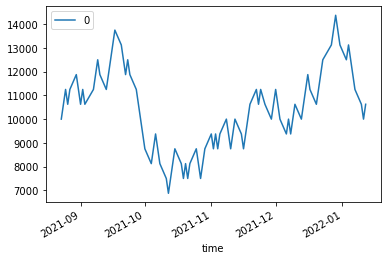

In [324]:
money_on_hand_df.plot()

<AxesSubplot:xlabel='time'>

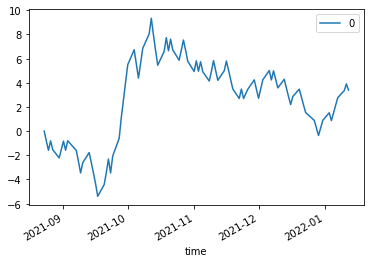

In [325]:
shares_df.plot()

In [341]:
value_of_shares_df=pd.DataFrame(shares_df[0].loc[:]*close_df.loc[:]["close"])

<AxesSubplot:xlabel='time'>

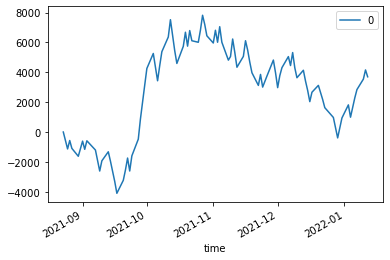

In [342]:
value_of_shares_df.plot()

In [343]:
value_of_shares_df

,0
time,
2020-02-12 00:00:00-05:00,NaN
2020-02-13 00:00:00-05:00,NaN
2020-02-14 00:00:00-05:00,NaN
2020-02-18 00:00:00-05:00,NaN
2020-02-19 00:00:00-05:00,NaN
...,...
2022-01-06 00:00:00-05:00,2287.248844
2022-01-07 00:00:00-05:00,2841.571880
2022-01-10 00:00:00-05:00,3541.369288


In [344]:
value_on_hand_df = value_of_shares_df[0] + money_on_hand_df[0]

In [345]:
value_on_hand_df

time
2020-02-12 00:00:00-05:00             NaN
2020-02-13 00:00:00-05:00             NaN
2020-02-14 00:00:00-05:00             NaN
2020-02-18 00:00:00-05:00             NaN
2020-02-19 00:00:00-05:00             NaN
                                 ...     
2022-01-06 00:00:00-05:00    14162.248844
2022-01-07 00:00:00-05:00    14091.571880
2022-01-10 00:00:00-05:00    14166.369288
2022-01-11 00:00:00-05:00    14156.099840
2022-01-12 00:00:00-05:00    14322.615415
Name: 0, Length: 485, dtype: float64

<AxesSubplot:xlabel='time'>

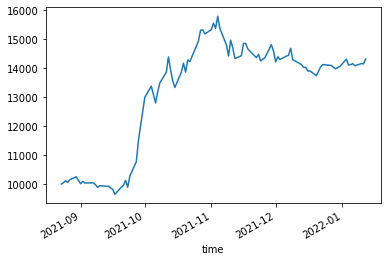

In [346]:
value_on_hand_df.plot()

In [347]:
money_on_hand

close    11250.0
dtype: object

In [348]:
shares

close    2.931728
dtype: object

In [349]:
end_money = money_on_hand + shares * close_df.iloc[-1]["close"]

In [350]:
end_money

close    14450.024697
dtype: object

In [351]:
end_money/start_money

close    1.445002
dtype: object

In [159]:
# # pseudocode outline:

# function to get price history - args are stock ticker/s, amount of days
# 	call alpaca
# 	return dataframe

# function to get twitter history
# 	possibly filter for repeated tweets
# 	return signal

# function to get news history
# 	return signal

# function to get reddit history
# 	return signal

# function to get general sentiment signals history
# 	call function to get twitter history
# 	call function to get news history
# 	call function to get reddit history
# 	return combined dataframe of signals


# function to get sentiment signals history of specific stock - arg is stock ticker
# 	call function to get twitter history
# 	call function to get news history
# 	call function to get reddit history
# 	return combined dataframe of signals

# function to run machine learning - arg is combined signals and stock history
# 	add additional columns for each signal for a daily percent change and a 5 day moving average a 100 day moving average
# 	scale
# 	train/test split
# 	try a few machine learning possibilities, svm, adaboost, possibly neural - try to guess if it will go up or down the following day

# 	try the following : reduce overfitting with early stopping
	
# 	neural - y is determined by whether it goes up or down the following day. two output neurons, highest one is selected to make signal.
# 	check amount correct, amount incorrect, and difference between actual and strategy.	

# 	neural 2nd stage - train only on the indexes which were incorrectly predicted.

	




# 	return buy/sell signal

# make function to calculate returns:
# don't use the function that just multiplies the signals by pct_return
# track the amount spent on each buy and amount returned on each sell.
# plot the total amount invested at any one time.
# possibly put a cutoff if no more money is available.
# possibly put a stop if unable to sell short.
# at the end, sell all or buy all short positions, get end result.
# compare to if the full amount initially available was all spent to purchase the stock at
# the beginning of the test period.


# Main function:
# 	determine which stocks to pull, one or many

# 	call function to get price history

# 	call function to get general sentiment signals history

# 	call function to get sentiment signals history for specific stock/s

# 	call function to run machine learning on the price history and signals

# 	output graphs





# terms to use in signal search for general:
# green
# renewable
# environment
# climate
# global warming
# climate crisis
# natural disaster
